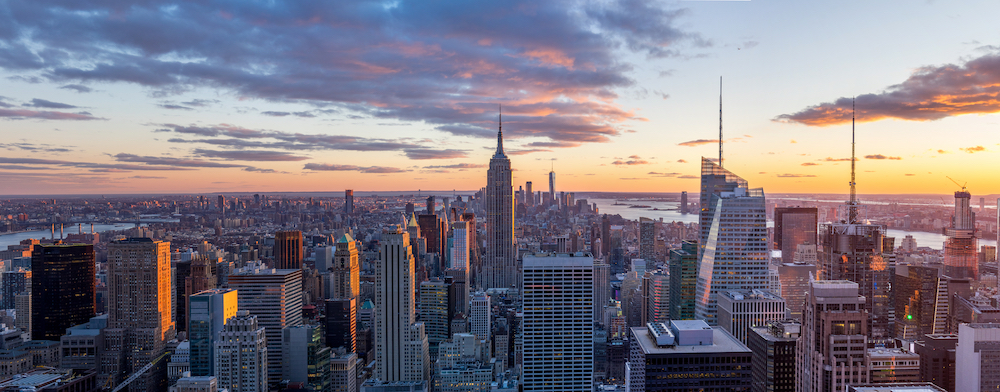

Welcome to New York City, one of the most-visited cities in the world. There are many Airbnb listings in New York City to meet the high demand for temporary lodging for travelers, which can be anywhere between a few nights to many months. In this project, we will take a closer look at the New York Airbnb market by combining data from multiple file types like `.csv`, `.tsv`, and `.xlsx`.

Recall that **CSV**, **TSV**, and **Excel** files are three common formats for storing data. 
Three files containing data on 2019 Airbnb listings are available to you:

**data/airbnb_price.csv**
This is a CSV file containing data on Airbnb listing prices and locations.
- **`listing_id`**: unique identifier of listing
- **`price`**: nightly listing price in USD
- **`nbhood_full`**: name of borough and neighborhood where listing is located

**data/airbnb_room_type.xlsx**
This is an Excel file containing data on Airbnb listing descriptions and room types.
- **`listing_id`**: unique identifier of listing
- **`description`**: listing description
- **`room_type`**: Airbnb has three types of rooms: shared rooms, private rooms, and entire homes/apartments

**data/airbnb_last_review.tsv**
This is a TSV file containing data on Airbnb host names and review dates.
- **`listing_id`**: unique identifier of listing
- **`host_name`**: name of listing host
- **`last_review`**: date when the listing was last reviewed

In [1030]:
# We've loaded your first package for you! You can add as many cells as you need.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Data Gathering

In [1031]:
df_csv = pd.read_csv('data/airbnb_price.csv')

df_xlsx = pd.read_excel('data/airbnb_room_type.xlsx')

df_tsv = pd.read_csv('data/airbnb_last_review.tsv', delimiter = '\t', parse_dates=['last_review'])

CSV

In [1032]:
display(df_csv)

,listing_id,price,nbhood_full
0,2595,225 dollars,"Manhattan, Midtown"
1,3831,89 dollars,"Brooklyn, Clinton Hill"
2,5099,200 dollars,"Manhattan, Murray Hill"
3,5178,79 dollars,"Manhattan, Hell's Kitchen"
4,5238,150 dollars,"Manhattan, Chinatown"
...,...,...,...
25204,36425863,129 dollars,"Manhattan, Upper East Side"
25205,36427429,45 dollars,"Queens, Flushing"
25206,36438336,235 dollars,"Staten Island, Great Kills"
25207,36442252,100 dollars,"Bronx, Mott Haven"


In [1033]:
df_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   listing_id   25209 non-null  int64 
 1   price        25209 non-null  object
 2   nbhood_full  25209 non-null  object
dtypes: int64(1), object(2)
memory usage: 591.0+ KB


In [1034]:
# cleaning up price column / if required further down analysis, we can collapse nbhood_full and create two category columns

df_csv['price'] = df_csv['price'].str.strip(' dollars').astype(float)

display(df_csv.head())

df_csv.info()

,listing_id,price,nbhood_full
0,2595,225.0,"Manhattan, Midtown"
1,3831,89.0,"Brooklyn, Clinton Hill"
2,5099,200.0,"Manhattan, Murray Hill"
3,5178,79.0,"Manhattan, Hell's Kitchen"
4,5238,150.0,"Manhattan, Chinatown"


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   listing_id   25209 non-null  int64  
 1   price        25209 non-null  float64
 2   nbhood_full  25209 non-null  object 
dtypes: float64(1), int64(1), object(1)
memory usage: 591.0+ KB


Excel

In [1035]:
display(df_xlsx)

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,Entire home/apt
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt
...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM
25205,36427429,No.2 with queen size bed,PRIVATE ROOM
25206,36438336,Seas The Moment,Private room
25207,36442252,1B-1B apartment near by Metro,Entire home/apt


In [1036]:
df_xlsx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   listing_id   25209 non-null  int64 
 1   description  25199 non-null  object
 2   room_type    25209 non-null  object
dtypes: int64(1), object(2)
memory usage: 591.0+ KB


In [1037]:
# cleaning up the excel dataframe for nulls

display(df_xlsx[df_xlsx['description'].isna()]) # only 10 rows out of 25k, okay to remove if there is any need down the line
# df_xlsx.dropna(subset='description', inplace=True)

,listing_id,description,room_type
4688,7851219,NaN,PRIVATE ROOM
4690,7854307,NaN,private room
4696,7858673,NaN,Private room
4707,7873655,NaN,PRIVATE ROOM
4709,7886635,NaN,Private room
4717,7901635,NaN,Private room
4829,8192443,NaN,private room
4901,8341556,NaN,Private room
5496,9698992,NaN,private room
11986,21733545,NaN,Private room


In [1038]:
df_xlsx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   listing_id   25209 non-null  int64 
 1   description  25199 non-null  object
 2   room_type    25209 non-null  object
dtypes: int64(1), object(2)
memory usage: 591.0+ KB


In [1039]:
# cleaning up room_type to lower case

df_xlsx['room_type'].value_counts(dropna=False)

df_xlsx['room_type'] = df_xlsx['room_type'].str.lower() # uniformity

display(df_xlsx)

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,entire home/apt
1,3831,Cozy Entire Floor of Brownstone,entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,entire home/apt
...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,private room
25205,36427429,No.2 with queen size bed,private room
25206,36438336,Seas The Moment,private room
25207,36442252,1B-1B apartment near by Metro,entire home/apt


In [1040]:
df_xlsx['room_type'].value_counts(dropna=False)

entire home/apt    13266
private room       11356
shared room          587
Name: room_type, dtype: int64

In [1041]:
display(df_tsv)

,listing_id,host_name,last_review
0,2595,Jennifer,2019-05-21
1,3831,LisaRoxanne,2019-07-05
2,5099,Chris,2019-06-22
3,5178,Shunichi,2019-06-24
4,5238,Ben,2019-06-09
...,...,...,...
25204,36425863,Rusaa,2019-07-07
25205,36427429,H Ai,2019-07-07
25206,36438336,Ben,2019-07-07
25207,36442252,Blaine,2019-07-07


In [1042]:
df_tsv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25209 entries, 0 to 25208
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   listing_id   25209 non-null  int64         
 1   host_name    25201 non-null  object        
 2   last_review  25209 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 591.0+ KB


In [1043]:
# cleaning up missing values from host_name, last_review has been fixed to datetime when importing the file

display(df_tsv[df_tsv['host_name'].isna()]) # only 8 rows out of 25k, okay to remove if there is any need down the line
# df_tsv.dropna(subset='host_name', inplace=True)

df_tsv['host_name'] = df_tsv['host_name'].str.lower() # uniformity

display(df_tsv)

,listing_id,host_name,last_review
263,100184,NaN,2019-07-08
3040,4183989,NaN,2019-05-23
4039,6292866,NaN,2019-06-19
4269,6786181,NaN,2019-06-19
6338,12113879,NaN,2019-07-02
8060,15648096,NaN,2019-07-07
12128,21867710,NaN,2019-01-01
12164,21901156,NaN,2019-01-01


,listing_id,host_name,last_review
0,2595,jennifer,2019-05-21
1,3831,lisaroxanne,2019-07-05
2,5099,chris,2019-06-22
3,5178,shunichi,2019-06-24
4,5238,ben,2019-06-09
...,...,...,...
25204,36425863,rusaa,2019-07-07
25205,36427429,h ai,2019-07-07
25206,36438336,ben,2019-07-07
25207,36442252,blaine,2019-07-07


Merging

In [1044]:
from functools import reduce

data_frames = [df_csv, df_xlsx, df_tsv]

df_merged = reduce(lambda left, right: pd.merge(left, right, on=['listing_id']), data_frames)

# df_merged['last_review'] = df_merged['last_review'].astype('datetime64')

display(df_merged)

,listing_id,price,nbhood_full,description,room_type,host_name,last_review
0,2595,225.0,"Manhattan, Midtown",Skylit Midtown Castle,entire home/apt,jennifer,2019-05-21
1,3831,89.0,"Brooklyn, Clinton Hill",Cozy Entire Floor of Brownstone,entire home/apt,lisaroxanne,2019-07-05
2,5099,200.0,"Manhattan, Murray Hill",Large Cozy 1 BR Apartment In Midtown East,entire home/apt,chris,2019-06-22
3,5178,79.0,"Manhattan, Hell's Kitchen",Large Furnished Room Near B'way,private room,shunichi,2019-06-24
4,5238,150.0,"Manhattan, Chinatown",Cute & Cozy Lower East Side 1 bdrm,entire home/apt,ben,2019-06-09
...,...,...,...,...,...,...,...
25204,36425863,129.0,"Manhattan, Upper East Side",Lovely Privet Bedroom with Privet Restroom,private room,rusaa,2019-07-07
25205,36427429,45.0,"Queens, Flushing",No.2 with queen size bed,private room,h ai,2019-07-07
25206,36438336,235.0,"Staten Island, Great Kills",Seas The Moment,private room,ben,2019-07-07
25207,36442252,100.0,"Bronx, Mott Haven",1B-1B apartment near by Metro,entire home/apt,blaine,2019-07-07


In [1045]:
df_merged['room_type'].isna().sum()

df_merged[df_merged['room_type'].isna()]

,listing_id,price,nbhood_full,description,room_type,host_name,last_review


What are the dates of the earliest and most recent reviews? Store these values as two separate variables with your preferred names.

In [1046]:
df_merged['last_review'] = pd.to_datetime(df_merged['last_review']).dt.normalize()

first_reviewed = min(df_merged['last_review'])
last_reviewed = max(df_merged['last_review'])

How many of the listings are private rooms? Save this into any variable.

In [1047]:
nb_private_rooms = df_merged.query('room_type == "private room"')['room_type'].value_counts()[0]
display(nb_private_rooms)

11356

What is the average listing price? Round to the nearest penny and save into a variable.

In [1048]:
avg_price = round(df_merged['price'].mean(),2)

Combine the new variables into one DataFrame called `review_dates` with four columns in the following order: `first_reviewed`, `last_reviewed`, `nb_private_rooms`, and `avg_price`. The DataFrame should only contain one row of values.

In [1049]:
custom_dict = {'first_reviewed': [first_reviewed], 'last_reviewed': [last_reviewed], 'nb_private_rooms': [nb_private_rooms], 'avg_price': [avg_price]}

review_dates = pd.DataFrame(custom_dict)
display(review_dates)

,first_reviewed,last_reviewed,nb_private_rooms,avg_price
0,2019-01-01,2019-07-09,11356,141.78
